In [ ]:
import pandas as pd
import numpy as np
import gzip
from google.colab import drive
import os
import matplotlib.pyplot as plt
import altair as alt

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.chdir('drive/Shareddrives/CapstoneProject/AoT_Chicago Reduced Data_V3')

In [ ]:
files = [os.getcwd() + '/'+f for f in os.listdir() if f != 'others']

In [ ]:
x = pd.read_csv(files[1], header=None)
#x.pivot(index=[0,1], columns=[3], values=[5])

In [ ]:
def get_data_clustering():
  '''Combine the data into a wide dataframe grouped by the time and the parameters 
      pivoted to value hrf.  Missing values for hrf are replaced by value_raw'''
  try:
    df = pd.read_csv('cluster_dataset.zip')
  except:
    df= pd.DataFrame()
    files = os.listdir()
    subsystems = ['chemsense', 'lightsense', 'metsense', 'alphasense', 'plantower']
    for i in files:
      if ('node' in i) | ('.csv' not in i):
        continue
      filepath = os.getcwd() + '/'+i
      name = i.strip('Numeric_').strip('.csv')
      data = pd.read_csv(filepath, header=None, engine='python')
      data.columns = ['created_at', 'subsystem','sensor_type', 'parameters', 'value_raw', 'value_hrf', 'count_raw_reads', 'count_hrf_reads']
      data = data[data['subsystem'].isin(subsystems)]  
      data['values'] = data['value_hrf']
      data['values'] = pd.to_numeric(data['values'], errors='coerce')
      data['sensor_id'] = name
      data['cols'] = data.apply(lambda x: x.parameters+"_"+x.sensor_type if x.parameters == 'concentration' else x.parameters, axis=1)
      data['date'] = pd.to_datetime(data['created_at']).dt.date
      data = data.groupby(['sensor_id', 'date', 'cols']).mean()['values'].reset_index()
      data = data.pivot_table(index=['sensor_id','date'], columns='cols', values='values')
      data.reset_index(inplace=True)
      if len(df)>0:
        df = pd.concat([df, data])
      else:
        df = data
  #df.columns = ['datetime', 'subsystem', 'sensor_type', 'temperature', 'value_raw', 'value_hrf', 'sensor_id']
  df.to_csv('cluster_dataset.zip', compression='zip')
  return df

In [ ]:
df = get_data_clustering()

In [ ]:
df

,sensor_id,date,humidity,intensity,temperature,acceleration_x,acceleration_y,acceleration_z,concentration_co,concentration_h2s,concentration_no2,concentration_o3,concentration_oxidizing_gases,concentration_reducing_gases,concentration_so2,magnetic_field_x,magnetic_field_y,magnetic_field_z,pressure,fw,pm1,pm10,pm2_5,sample_flow_rate,sampling_period,id,10um_particle,1um_particle,2_5um_particle,5um_particle,pm10_atm,pm10_cf1,pm1_atm,pm1_cf1,pm25_atm,pm25_cf1,point_3um_particle,point_5um_particle,onset_rain,soil_conductivity,soil_dielectric,soil_temperature
0,001e0610ef26,2018-03-09,3.799996,28.585659,1.993806,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,001e0610ef26,2018-03-13,26.893524,34.519490,3.452670,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,001e0610ef26,2018-03-14,6.097573,17.144203,0.534777,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001e0610ef26,2018-03-16,6.135071,24.504746,-0.225464,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001e0610ef26,2018-03-17,12.393956,20.512314,4.265497,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
428,001e061144be,2019-11-30,60.016105,19.323122,12.769574,4.750382,-996.453315,36.131513,0.067008,0.013444,0.009907,0.006726,0.018137,0.017711,0.177827,-104.131065,-88.206363,-121.949258,991.834695,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
429,001e061144be,2019-12-01,61.347251,18.965614,13.953428,5.696289,-997.061478,36.551248,0.073365,0.013833,0.007079,0.005943,0.041439,0.016916,0.178804,-104.395778,-87.784655,-122.110661,974.166924,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
430,001e061144be,2019-12-02,56.348295,20.519384,10.341559,-1.422718,-992.428152,35.389187,0.089937,0.012714,0.024826,0.009412,0.054576,0.018818,0.188689,-108.337976,-92.235321,-120.874464,991.528969,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
431,001e061144be,2019-12-03,57.409793,23.635403,9.314809,-0.252070,-992.992520,35.522661,0.092350,0.013930,0.019284,0.008556,0.069926,0.018312,0.175606,-108.468192,-92.803943,-120.164475,990.020276,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# initial clustering based on types of sensors
def sparse_matrix(df):
  '''Returns a 1 if there is a value in the column and a zero if there is no value'''
  cols = [f for f in df.columns if f not in ['sensor_id', 'date']]

  df = df.groupby('sensor_id').mean()[cols]
  df = df.notnull().astype(int)
  return df


In [ ]:
sparse_matrix(df)

,humidity,intensity,temperature,acceleration_x,acceleration_y,acceleration_z,concentration_co,concentration_h2s,concentration_no2,concentration_o3,concentration_oxidizing_gases,concentration_reducing_gases,concentration_so2,magnetic_field_x,magnetic_field_y,magnetic_field_z,pressure,fw,pm1,pm10,pm2_5,sample_flow_rate,sampling_period,id,10um_particle,1um_particle,2_5um_particle,5um_particle,pm10_atm,pm10_cf1,pm1_atm,pm1_cf1,pm25_atm,pm25_cf1,point_3um_particle,point_5um_particle,onset_rain,soil_conductivity,soil_dielectric,soil_temperature
sensor_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
001e0610890f,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
001e06109401,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
001e06109416,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
001e06109f62,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
001e0610b9e5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
001e061184a3,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0
001e06118501,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0
001e06118509,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0


# Clustering based on sensors at each location

In [ ]:
# agglomorative 
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

In [ ]:
def plot_clusters(model):
  counts = np.zeros(model.children_.shape[0])
  n_samples = len(model.labels_)
  for i, merge in enumerate(model.children_):
    current_count = 0
    for child_idx in merge:
      if child_idx < n_samples:
        current_count +=1
      else: 
        current_count += counts[child_idx - n_samples]
      counts[i] = current_count

  linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
  dendrogram(linkage_matrix)


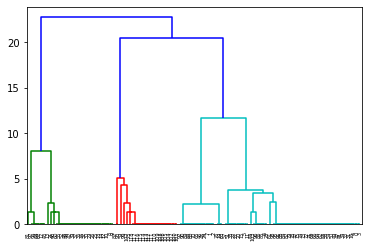

In [ ]:
model = AgglomerativeClustering(distance_threshold=15, n_clusters=None)
model.fit(sparse_matrix(df))

plot_clusters(model)

There are three very distinct cluster groups in this model that separate early with a possible 4th group.  Most of the nodes have a lot of the same weather sensors. With the inclusion of the alphasense sensors and exclusion of image data (only a few sensors), we end up with good separation of multiple cluster groups.

In [ ]:
def get_model_labels(model):
  sensors = sparse_matrix(df)
  sensors['cluster_groups'] = model.labels_
  value_vars = list(sensors.columns)
  value_vars.remove('cluster_groups')
  sensors = pd.melt(sensors.reset_index(), id_vars=['sensor_id','cluster_groups'], value_vars = value_vars)
  return sensors

In [ ]:
alt.data_transformers.disable_max_rows()
alt.Chart(get_model_labels(model)).mark_bar().encode(
    x='variable:N',
    y='sum(value):Q',
    color='cluster_groups:N'
)

alt.Chart(...)

In [ ]:
import folium

In [ ]:
node_map = get_model_labels(model).merge(pd.read_csv('others/nodes.csv'), left_on='sensor_id', right_on='node_id', how='left')
node_map = node_map[['sensor_id', 'cluster_groups', 'lat', 'lon']].drop_duplicates()

In [ ]:
m = folium.Map(location=[node_map.lat.mean(), node_map.lon.mean()], zoom_start=10, height=800, width=800)
color_map = {0:'blue', 1:'orange', 2:'red'}
node_map.dropna().apply(lambda x: folium.Marker([x.lat,x.lon], popup=x.sensor_id, icon=folium.Icon(color=color_map[x.cluster_groups])).add_to(m), axis=1)
m

From the map above, we can see that Cluster group 0 is roughly evenly distributed around the city.  Group 1 is concentrated more toward the city center and Group 2 appears more in the suburbs of the city.

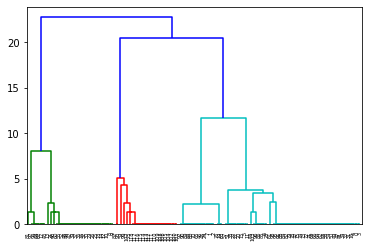

In [ ]:

model_two = AgglomerativeClustering(distance_threshold=9, n_clusters=None)
model_two.fit(sparse_matrix(df))

plot_clusters(model_two)

In [ ]:
alt.data_transformers.disable_max_rows()
alt.Chart(get_model_labels(model_two)).mark_bar().encode(
    x='variable:N',
    y='sum(value):Q',
    color='cluster_groups:N'
)

alt.Chart(...)

In [ ]:
node_map2 = get_model_labels(model_two).merge(pd.read_csv('others/nodes.csv'), left_on='sensor_id', right_on='node_id', how='left')
node_map2 = node_map2[['sensor_id', 'cluster_groups', 'lat', 'lon']].drop_duplicates()

In [ ]:
m2 = folium.Map(location=[node_map2.lat.mean(), node_map2.lon.mean()], zoom_start=10, height=800, width=800)
color_map2 = {0:'blue', 1:'orange', 2:'red', 3:'green'}
node_map2.dropna().apply(lambda x: folium.Marker([x.lat,x.lon], popup=x.sensor_id, icon=folium.Icon(color=color_map2[x.cluster_groups])).add_to(m2), axis=1)
m2

# Clustering based on values

In [ ]:
clusters = sparse_matrix(df).reset_index()
clusters['cluster_groups'] = model.labels_
clusters

,sensor_id,humidity,intensity,temperature,acceleration_x,acceleration_y,acceleration_z,concentration_co,concentration_h2s,concentration_no2,concentration_o3,concentration_oxidizing_gases,concentration_reducing_gases,concentration_so2,magnetic_field_x,magnetic_field_y,magnetic_field_z,pressure,fw,pm1,pm10,pm2_5,sample_flow_rate,sampling_period,id,10um_particle,1um_particle,2_5um_particle,5um_particle,pm10_atm,pm10_cf1,pm1_atm,pm1_cf1,pm25_atm,pm25_cf1,point_3um_particle,point_5um_particle,onset_rain,soil_conductivity,soil_dielectric,soil_temperature,cluster_groups
0,001e0610890f,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,001e06109401,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,001e06109416,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,001e06109f62,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,001e0610b9e5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,001e061184a3,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,2
115,001e06118501,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,2
116,001e06118509,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,2
117,001e0611850f,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,2


In [ ]:
data = df.merge(clusters[['sensor_id', 'cluster_groups']], how='left', on='sensor_id')

For our analysis, we are focusing mostly on the air quality metrics.  We will include the concentration and ppm metrics. We are also interested in comparing results before and during the initial covid lockdowns.

In [ ]:
data.columns

Index(['sensor_id', 'date', 'humidity', 'intensity', 'temperature',
       'acceleration_x', 'acceleration_y', 'acceleration_z',
       'concentration_co', 'concentration_h2s', 'concentration_no2',
       'concentration_o3', 'concentration_oxidizing_gases',
       'concentration_reducing_gases', 'concentration_so2', 'magnetic_field_x',
       'magnetic_field_y', 'magnetic_field_z', 'pressure', 'fw', 'pm1', 'pm10',
       'pm2_5', 'sample_flow_rate', 'sampling_period', 'id', '10um_particle',
       '1um_particle', '2_5um_particle', '5um_particle', 'pm10_atm',
       'pm10_cf1', 'pm1_atm', 'pm1_cf1', 'pm25_atm', 'pm25_cf1',
       'point_3um_particle', 'point_5um_particle', 'onset_rain',
       'soil_conductivity', 'soil_dielectric', 'soil_temperature',
       'cluster_groups'],
      dtype='object')

In [ ]:
cols = [c for c in data.columns if 'concentration'in c ]

In [ ]:
cols

['concentration_co',
 'concentration_h2s',
 'concentration_no2',
 'concentration_o3',
 'concentration_oxidizing_gases',
 'concentration_reducing_gases',
 'concentration_so2']

There are lots of rows in this data set.  It will be useful to first split into the two groups identified earlier.  It may also be useful to find an average cluster group across each day.  

In [ ]:
data['day'] = pd.to_datetime(data['date']).dt.strftime('%m-%d')

In [ ]:
from sklearn.cluster import DBSCAN, OPTICS

In [ ]:
cluster = data.set_index(['cluster_groups', 'sensor_id','day', 'date'])[cols]


In [ ]:
#drop rows where all concentration values are missing
cluster = cluster[cols].dropna(axis=0, how='all').reset_index(drop=False)

In [ ]:
cluster

,cluster_groups,sensor_id,day,date,concentration_co,concentration_h2s,concentration_no2,concentration_o3,concentration_oxidizing_gases,concentration_reducing_gases,concentration_so2
0,0,001e0610890f,05-02,2018-05-02,7.339609,0.409944,0.128987,0.012320,9.373427,0.412306,0.662081
1,0,001e0610890f,05-03,2018-05-03,0.476925,0.014425,0.001255,0.000138,NaN,0.047870,0.265977
2,0,001e0610890f,05-04,2018-05-04,0.229621,0.015348,0.003469,0.002697,NaN,0.042127,0.248507
3,0,001e0610890f,05-05,2018-05-05,0.090416,0.017132,0.005819,0.004429,NaN,0.027137,0.244996
4,0,001e0610890f,05-06,2018-05-06,0.092886,0.013828,0.007077,0.004764,NaN,0.018329,0.238735
...,...,...,...,...,...,...,...,...,...,...,...
16245,0,001e061144be,11-30,2019-11-30,0.067008,0.013444,0.009907,0.006726,0.018137,0.017711,0.177827
16246,0,001e061144be,12-01,2019-12-01,0.073365,0.013833,0.007079,0.005943,0.041439,0.016916,0.178804
16247,0,001e061144be,12-02,2019-12-02,0.089937,0.012714,0.024826,0.009412,0.054576,0.018818,0.188689
16248,0,001e061144be,12-03,2019-12-03,0.092350,0.013930,0.019284,0.008556,0.069926,0.018312,0.175606


In [ ]:
cluster.cluster_groups.unique()

array([0, 2])

We can see that none of cluster 1 nodes are represented in this portion.  

In [ ]:
#split data before and after the lockdowns
before = cluster[cluster['date']<'2020-03-01'].groupby(['sensor_id', 'day']).mean()[cols].reset_index()
after = cluster[cluster['date']>='2020-03-01'].groupby(['sensor_id', 'day']).mean()[cols].reset_index()

In [ ]:
np.nanmin(after[cols].to_numpy())

0.0

In [ ]:
# format the data as an array
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture



def cluster_values(before, after, metric):
  before = before.sort_values('day').pivot(index='sensor_id', columns='day', values=metric)
  after = after.sort_values('day').pivot(index='sensor_id', columns='day', values=metric)
  
  #scale data before to between 0 and 1  
  before_scaled = before.values
  before_scaled[np.isnan(before_scaled)] = 0
  
  after_scaled = after.values
  after_scaled[np.isnan(after_scaled)] = 0

  # bmax = np.nanmax(before_scaled)
  # bmin = np.nanmin(before_scaled)
  # scaler = lambda x: (x-bmin) / (bmax-bmin)

  # before_scaled = scaler(before_scaled)
  # after_scaled = scaler(after_scaled)
  

  
  #inefficient way to get labels
  before_clusters = before.reset_index()[['sensor_id']]
  after_clusters = after.reset_index()[['sensor_id']]
  
  dbscan = DBSCAN(eps=1, min_samples=2).fit(before_scaled)
  before_clusters['dbscan'] = dbscan.labels_
  db_after = DBSCAN(eps=3, min_samples=3).fit(after_scaled)
  after_clusters['dbscan'] = db_after.labels_
  #return before_scaled, after_scaled
  return before_clusters, after_clusters

In [ ]:
before_clusters, after_clusters = cluster_values(before, after, 'concentration_no2')

In [ ]:
before_clusters['dbscan'].unique()

array([ 0, -1])

In [ ]:
after_clusters['dbscan'].unique()

array([ 0, -1])

After iterating through many possible settings for the DBSCAN algorithm, we found there was almost always one cluster group.  This may be because of the variance over the years on the same day.  The next attempt will instead average by the day of the week and attempt to identify trends that may be lost on the yearly average.  Density based clustering may also not be the best method.  We are going to try and use a Gaussian Mixture instead.

In [ ]:
dayofweek = {0:"Monday", 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}
cluster['day_of_week'] = cluster['date'].dt.dayofweek
cluster['day_of_week'] = cluster['day_of_week'].apply(lambda x: dayofweek[x])
before = cluster[cluster['date']<'2020-03-01'].groupby(['sensor_id', 'day_of_week']).mean()[cols].reset_index()
after = cluster[cluster['date']>='2020-03-01'].groupby(['sensor_id', 'day_of_week']).mean()[cols].reset_index()
before

,sensor_id,day_of_week,concentration_co,concentration_h2s,concentration_no2,concentration_o3,concentration_oxidizing_gases,concentration_reducing_gases,concentration_so2
0,001e0610890f,Friday,0.239378,0.014103,0.002270,0.001310,NaN,0.019070,0.233383
1,001e0610890f,Monday,0.550848,0.013842,0.002163,0.001356,NaN,0.012930,0.230087
2,001e0610890f,Saturday,0.404631,0.014907,0.002261,0.001973,NaN,0.017069,0.229728
3,001e0610890f,Sunday,0.071465,0.014207,0.002408,0.001731,NaN,0.013299,0.231499
4,001e0610890f,Thursday,1.006535,0.021214,0.010624,0.004896,13.164673,0.050868,0.251487
...,...,...,...,...,...,...,...,...,...
580,001e0611856d,Saturday,0.160118,0.008067,0.000956,0.001385,0.271999,0.027462,0.161574
581,001e0611856d,Sunday,0.216881,0.008774,0.000532,0.000388,0.203592,0.027305,0.145569
582,001e0611856d,Thursday,0.242299,0.009714,0.001538,0.000812,0.166396,0.029443,0.143533
583,001e0611856d,Tuesday,2.607270,0.031868,0.048008,0.006017,1.709605,0.260044,0.279964


In [ ]:
before_chart = alt.Chart(before.groupby('day_of_week').mean()[cols].reset_index().melt(id_vars='day_of_week')).mark_line().encode(
    x = alt.X('day_of_week:N',sort=['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']),
    y = 'value:Q',
    color = 'variable:N',
    
  ).properties(width=700, height=300)
after_chart = alt.Chart(after.groupby('day_of_week').mean()[cols].reset_index().melt(id_vars='day_of_week')).mark_line().encode(
    x = alt.X('day_of_week:N',sort=['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']),
    y = 'value:Q',
    color = 'variable:N',
    
  ).properties(width=700, height=300)

before_chart & after_chart

alt.VConcatChart(...)

We can see there is a increase in CO espeically during the latter half of the week.  This may also be due to the time of the year.  To compensate for this, we will run two more clustering analysis to see how they compare specifically around this time of year over the entire range

In [ ]:
from sklearn.cluster import SpectralClustering, AffinityPropagation, OPTICS

def cluster_values_dow_full_year(cluster, cols, method='dayofweek'):
  if method == 'dayofweek':
    dayofweek = {0:"Monday", 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}
    cluster['day_of_week'] = cluster['date'].dt.dayofweek
    cluster['day_of_week'] = cluster['day_of_week'].apply(lambda x: dayofweek[x])
    before = cluster[cluster['date']<'2020-03-21'].groupby(['sensor_id', 'day_of_week']).mean()[cols].reset_index()
    after = cluster[cluster['date']>='2020-03-21'].groupby(['sensor_id', 'day_of_week']).mean()[cols].reset_index()

    before = before.groupby(['sensor_id', 'day_of_week']).mean()[cols].reset_index()
    after = after.groupby(['sensor_id', 'day_of_week']).mean()[cols].reset_index()
  
    before[cols] = (before[cols] - before[cols].min()) / (before[cols].max() - before[cols].min())
    after[cols] = (after[cols] - before[cols].min()) / (before[cols].max() - before[cols].min())

    before = before.pivot(index='sensor_id', columns='day_of_week', values=cols)
    after = after.pivot(index='sensor_id', columns='day_of_week', values=cols)

  else: 
    before = cluster[cluster['date']<'2020-03-01'].groupby(['sensor_id', 'day']).mean()[cols].reset_index()
    after = cluster[cluster['date']>='2020-03-01'].groupby(['sensor_id', 'day']).mean()[cols].reset_index()
    before = before.sort_values('day').pivot(index='sensor_id', columns='day', values=cols)
    after = after.sort_values('day').pivot(index='sensor_id', columns='day', values=cols)
  
  
  #scale data before to between 0 and 1 
  before_scaled = before.values
  before_scaled[np.isnan(before_scaled)] = 0
  
  after_scaled = after.values
  after_scaled[np.isnan(after_scaled)] = 0

  
  before_clusters = before.reset_index()[['sensor_id']]
  before_clusters.columns = before_clusters.columns.droplevel(1)
  after_clusters = after.reset_index()[['sensor_id']]
  after_clusters.columns = after_clusters.columns.droplevel(1)

  
  np.random.seed(0)

  cluster_algorithms = {"Agglomerative":AgglomerativeClustering(distance_threshold=None, n_clusters=5),
                        'DBSCAN':DBSCAN(eps=0.3), 'OPTICS': OPTICS(), 
                        'Spectral': SpectralClustering(n_clusters=2), 
                        'AffinityPropagation': AffinityPropagation()}

  for i in cluster_algorithms.keys():
    algorithm = cluster_algorithms[i]
    #before_model = algorithm.fit(before_scaled)
    before_clusters[i] = algorithm.fit_predict(before_scaled)
    #after_model =dbscan.fit(after_scaled) 
    after_clusters["after_" + i] = algorithm.fit_predict(after_scaled)
  cluster_groups = before_clusters.merge(after_clusters, on='sensor_id', how='outer')
  return cluster_groups, before_clusters, after_clusters

  


In [ ]:
cluster_groups, before_clusters, after_clusters = cluster_values_dow_full_year(cluster, cols=cols, method='total')

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
before_clusters

,sensor_id,Agglomerative,DBSCAN,OPTICS,Spectral,AffinityPropagation
0,001e0610890f,0,-1,0,0,2
1,001e06109401,0,-1,-1,0,8
2,001e06109416,0,-1,-1,0,2
3,001e06109f62,0,-1,0,0,2
4,001e0610b9e5,2,-1,-1,0,0
...,...,...,...,...,...,...
81,001e061184a3,1,-1,-1,0,22
82,001e06118501,0,-1,-1,0,2
83,001e06118509,0,-1,0,0,2
84,001e0611850f,0,-1,0,0,2


In [ ]:
#clustered_data.to_csv('others/clustered_dataset.csv', index=False)

In [ ]:
clustered_data = cluster.merge(before_clusters, on='sensor_id', how='outer')

lockdown_data = clustered_data[clustered_data['date']>='2020-03-01']

In [ ]:
def cluster_timeseries(data, cols):
  row = None
  column = None
  for i in ['Agglomerative','DBSCAN','OPTICS', 'Spectral','AffinityPropagation']:
    row = None
    for j in cols:
      df = data.groupby(['date', i]).mean()[[j]].reset_index()
      c = alt.Chart(df).mark_line().encode(
          x=alt.X('date:T', title=''),
          y=f'{j}:Q',
          color=f'{i}:N'
      ).properties(width=200)
      if row == None:
        row = c 
      else:
        row = row|c
    if column == None:
      column = row
    else:
      column = (column&row).resolve_scale(color='independent')
  return column

In [ ]:
cluster_timeseries(clustered_data, cols)

alt.VConcatChart(...)

In [ ]:
cluster_groups, before_clusters, after_clusters = cluster_values_dow_full_year(cluster, cols=cols)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:261: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  "Graph is not fully connected, spectral embedding may not work as expected."


In [ ]:
clustered_data2 = cluster.merge(before_clusters, on='sensor_id', how='outer')
clustered_data2.to_csv('streamlit/data/clustered_dataset.csv')
cluster_timeseries(clustered_data2, cols)

alt.VConcatChart(...)

In [ ]:
#before_clusters.to_csv("others/ClusterGroups.csv")

In [ ]:
clustered_data.shape

(16250, 17)

In [ ]:
optics = before_clusters.merge(pd.read_csv('others/nodes.csv'), left_on='sensor_id', right_on='node_id', how='left')

optics = optics[['sensor_id', 'OPTICS','Agglomerative',  'lat', 'lon']].dropna()

m3 = folium.Map(location=[optics.lat.mean(), optics.lon.mean()], zoom_start=10, height=800, width=800)
color_map2 = {0:'blue', 1:'orange',  2:'red', 3:'lightblue', 4:'green'}
optics.apply(lambda x: folium.Marker([x.lat,x.lon], popup=x.sensor_id, icon=folium.Icon(color=color_map2[x.Agglomerative])).add_to(m3), axis=1)
m3

In [ ]:
optics

,sensor_id,OPTICS,Agglomerative,lat,lon
0,001e0610890f,-1,1,41.793278,-87.600117
1,001e06109401,-1,0,41.685445,-87.611081
2,001e06109416,-1,1,41.916586,-87.666406
3,001e06109f62,-1,1,41.842410,-87.724499
4,001e0610b9e5,-1,3,41.994597,-87.655523
...,...,...,...,...,...
81,001e061184a3,-1,1,41.714021,-87.659612
82,001e06118501,-1,1,41.779805,-87.649145
83,001e06118509,-1,1,41.779744,-87.654487
84,001e0611850f,-1,1,41.692837,-87.613419
